In [94]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl

from IPython.display import display

In [95]:
# Load the data
df = pd.read_pickle("../../data/intermediate/01_data_processed.pkl")
df.head()

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,label,category,participant,set
epoch (ms),,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,bench,heavy,B,30
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,bench,heavy,B,30
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,bench,heavy,B,30
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,bench,heavy,B,30
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,bench,heavy,B,30


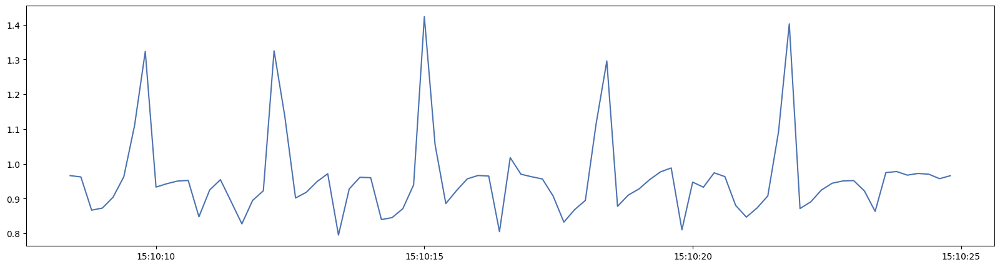

In [96]:
# Plot single columns
set_df = df[df["set"] == 1]
plt.plot(set_df["acc_y"]);

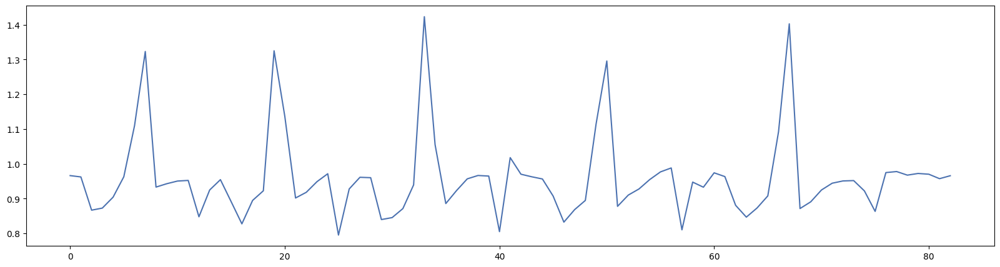

In [97]:
plt.plot(set_df["acc_y"].reset_index(drop=True));

In [98]:
# Adjust plot settings
mpl.style.use("seaborn-v0_8-deep")
mpl.rcParams["figure.figsize"] = (20,5)
mpl.rcParams["figure.dpi"] = 100

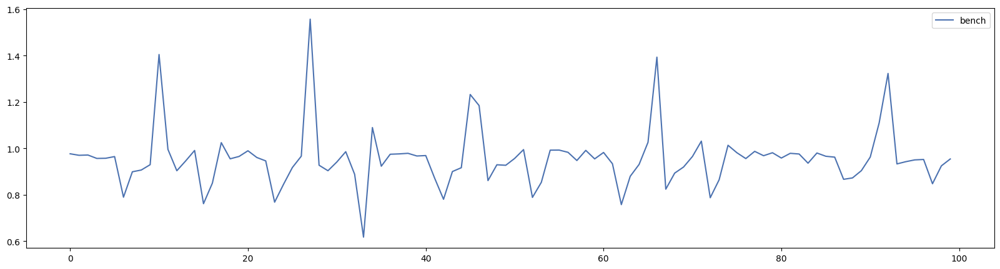

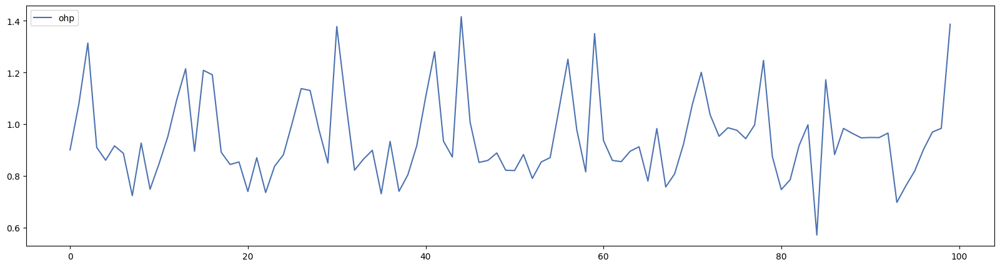

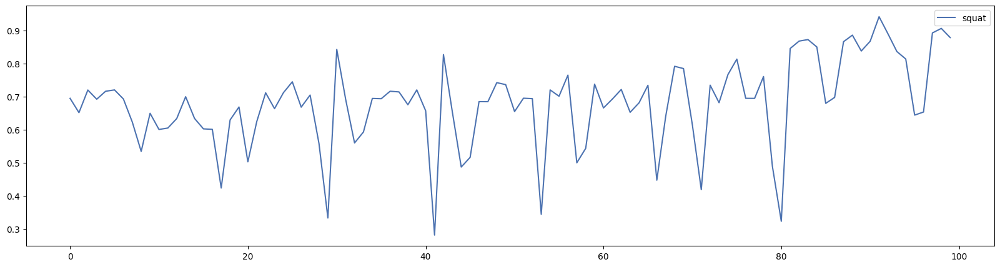

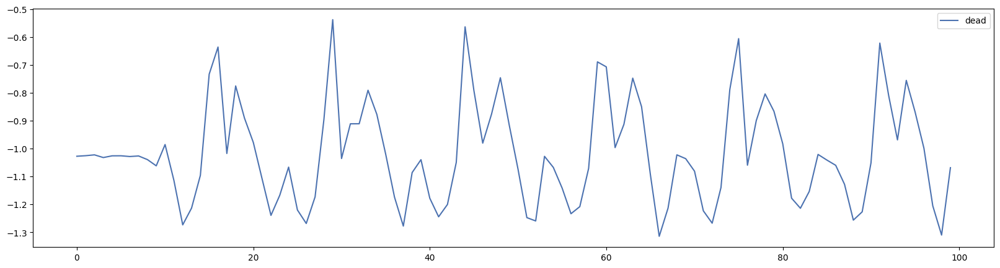

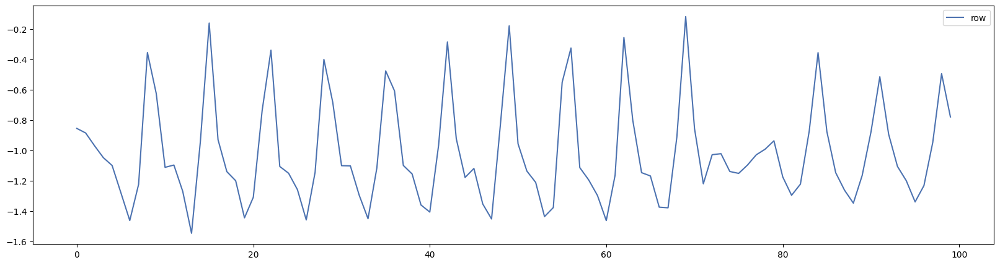

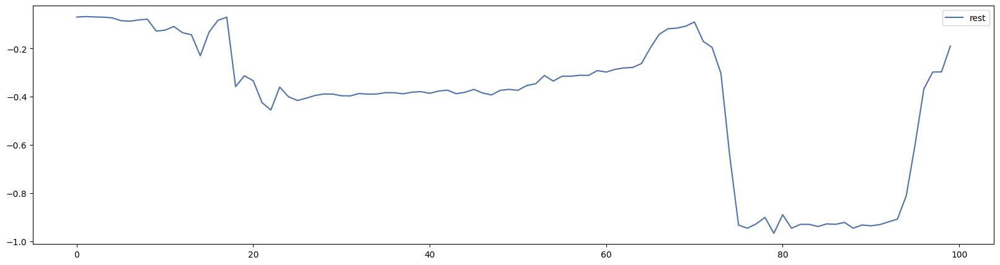

In [99]:
# Plot all exercises
for label in df["label"].unique():
    subset = df[df["label"] == label]
    #display(subset)
    fig, ax = plt.subplots()
    plt.plot(subset[:100]["acc_y"].reset_index(drop=True), label = label);
    plt.legend()
    plt.show()

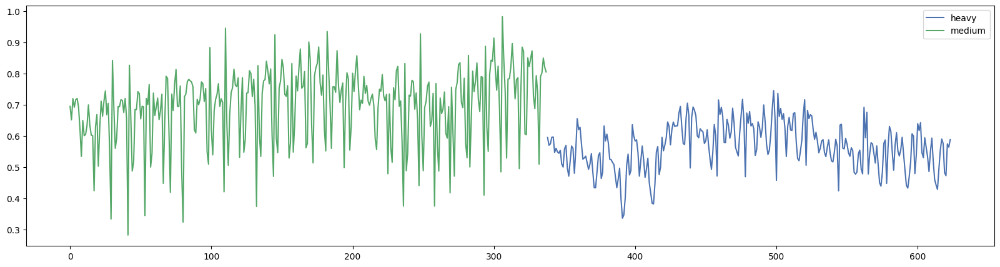

In [100]:
# Compare medium vs. heavy sets
category_df = df.query("label == 'squat'").query("participant == 'A'").reset_index()

fig, ax = plt.subplots()
category_df.groupby(["category"])["acc_y"].plot()
ax.set_ylabel = "acc_y"
ax.set_xlabel = "samples"
plt.legend();

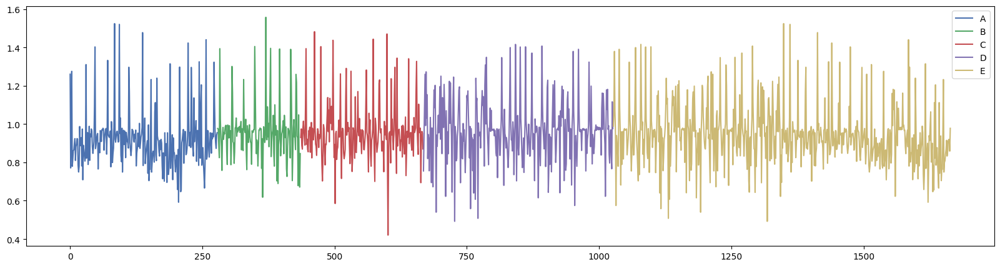

In [101]:
# Compare participants
participant_df = df.query("label == 'bench'").sort_values("participant").reset_index()
fig, ax = plt.subplots()
participant_df.groupby(["participant"])["acc_y"].plot()
ax.set_ylabel = "acc_y"
ax.set_xlabel = "samples"
plt.legend();

In [102]:
# Plot multiple axis
# label = "squat"
# participant = "A"

# all_axis_df = df.query(f"label == '{label}'").query(f"participant == '{participant}'").reset_index()
# fig, ax = plt.subplots()
# all_axis_df[["acc_x","acc_y","acc_z"]].plot(ax=ax)
# ax.set_ylabel = "acc"
# ax.set_xlabel = "samples"
# plt.legend();


C:\Users\Melis Nur\AppData\Local\Temp\ipykernel_7104\1698938126.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


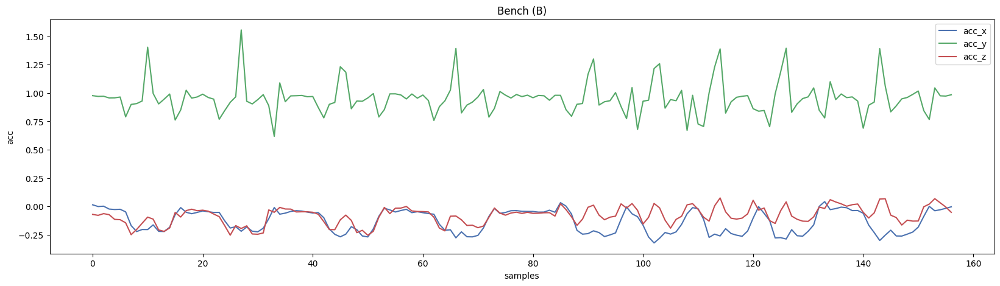

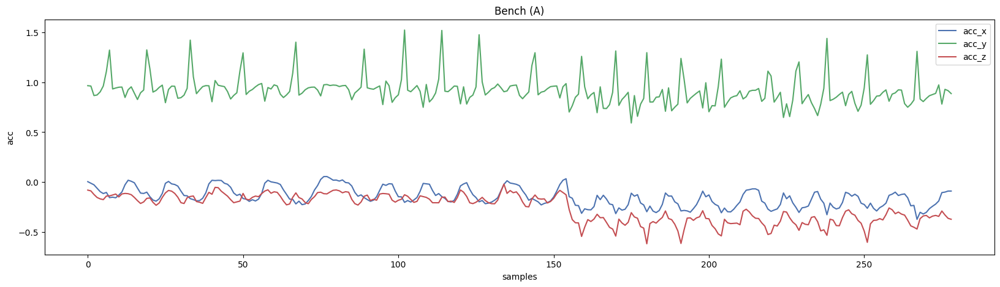

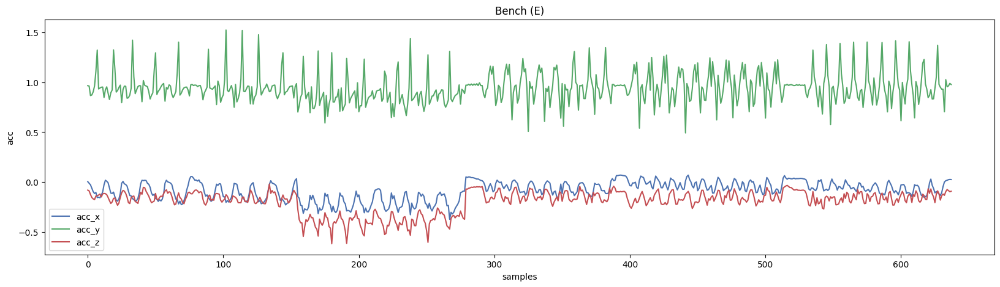

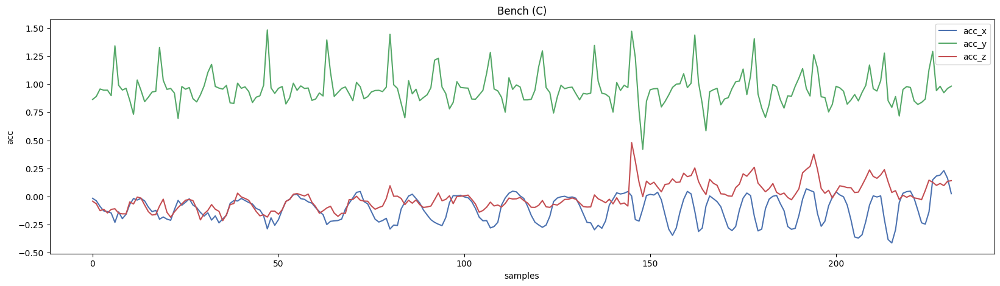

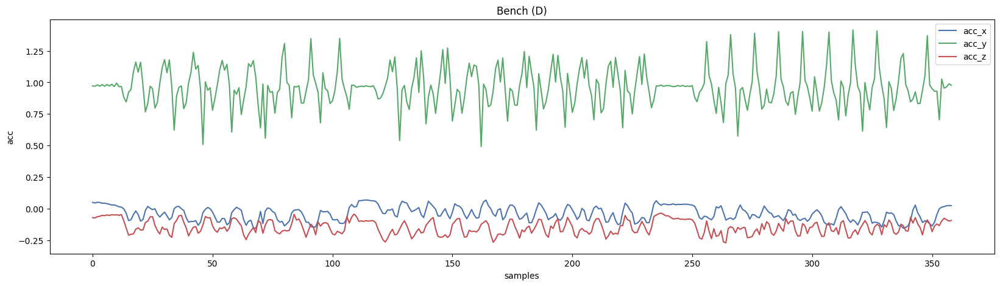

...

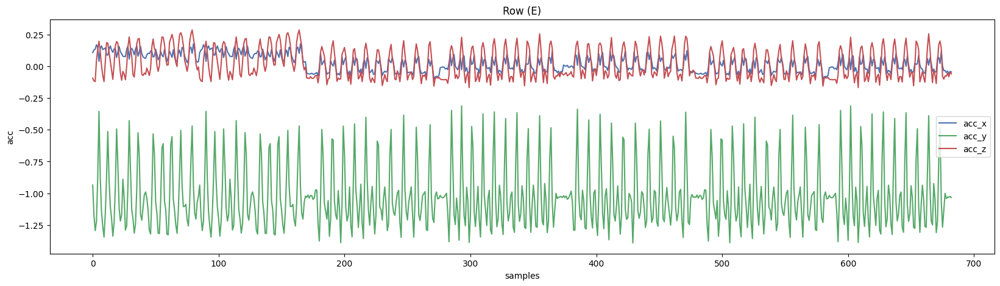

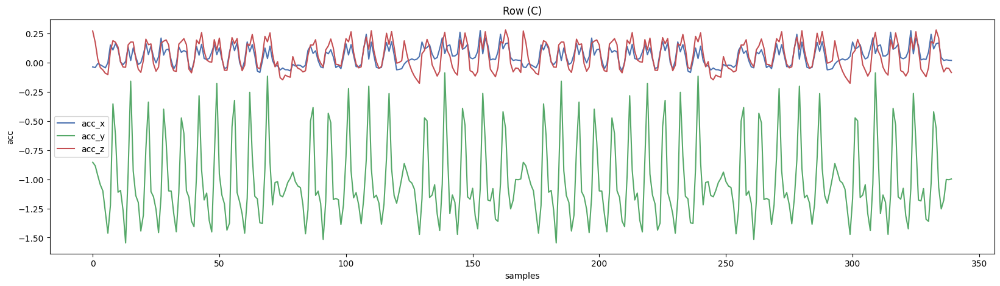

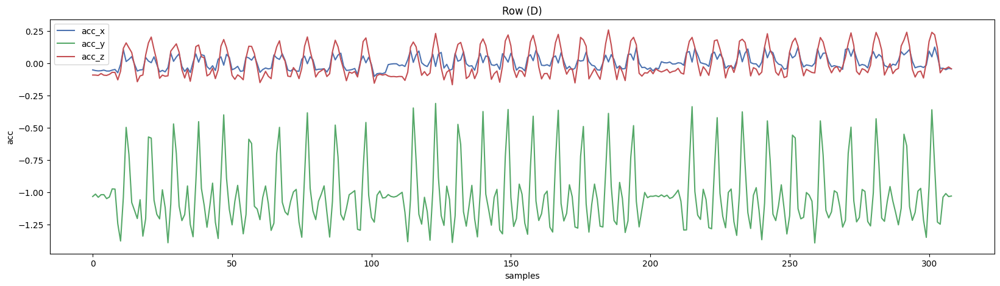

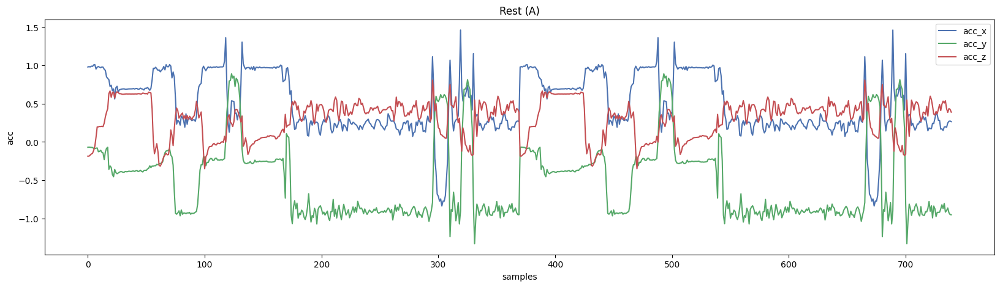

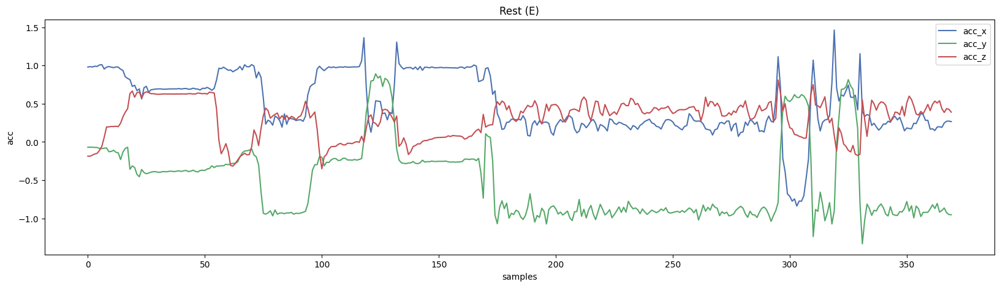

In [103]:
# Create a loop to plot all combinations per sensor

labels = df["label"].unique()
participants = df["participant"].unique()

for label in labels:
    for participant in participants:
        all_axis_df = df.query(f"label == '{label}'").query(f"participant == '{participant}'").reset_index()


        if len(all_axis_df) > 0:
            fig, ax = plt.subplots()
            all_axis_df[["acc_x","acc_y","acc_z"]].plot(ax=ax)
            ax.set_ylabel("acc")
            ax.set_xlabel("samples")
            plt.title(f"{label} ({participant})".title())
            plt.legend();

C:\Users\Melis Nur\AppData\Local\Temp\ipykernel_7104\1807546943.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


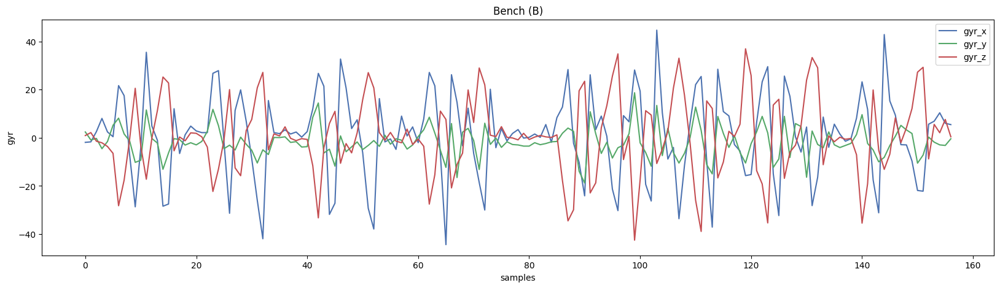

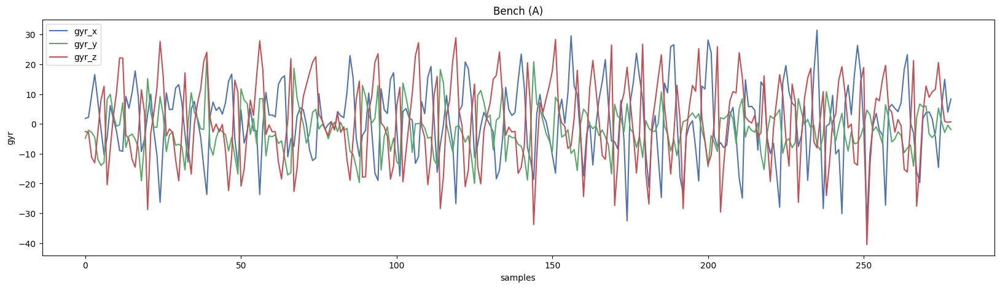

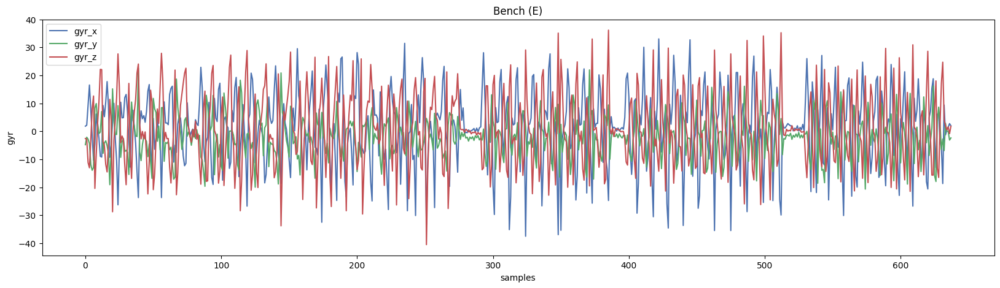

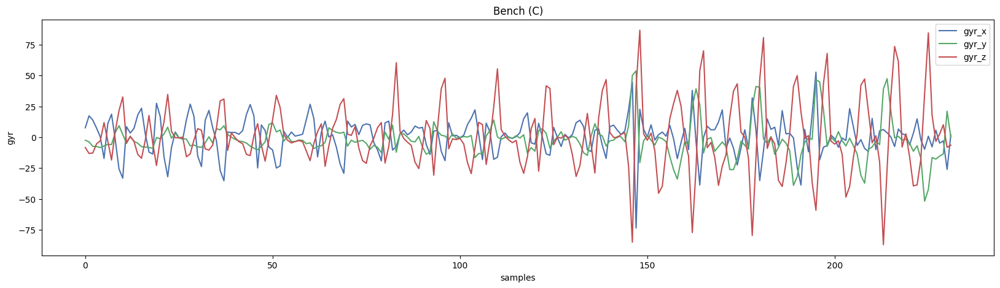

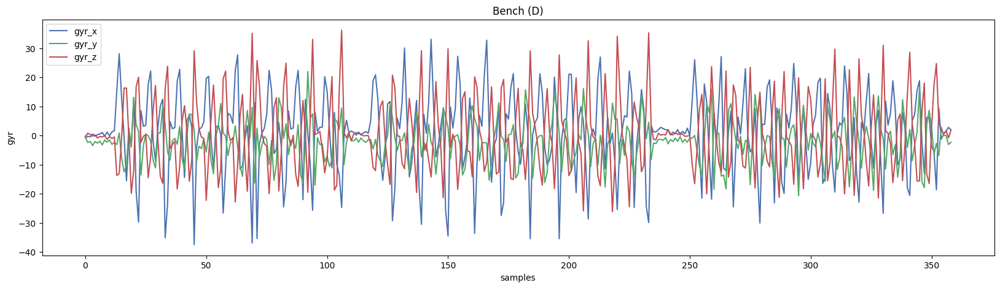

...

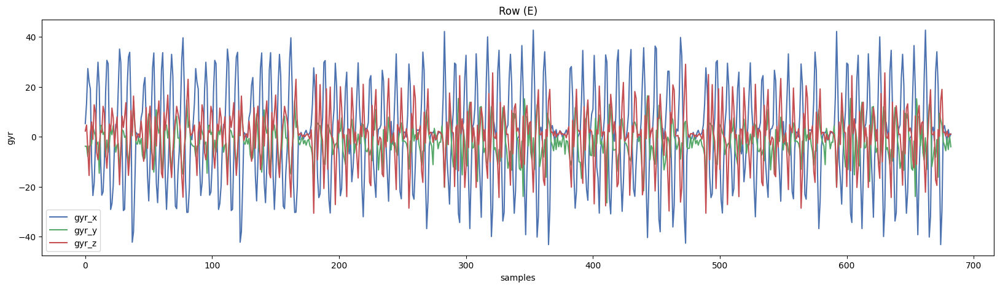

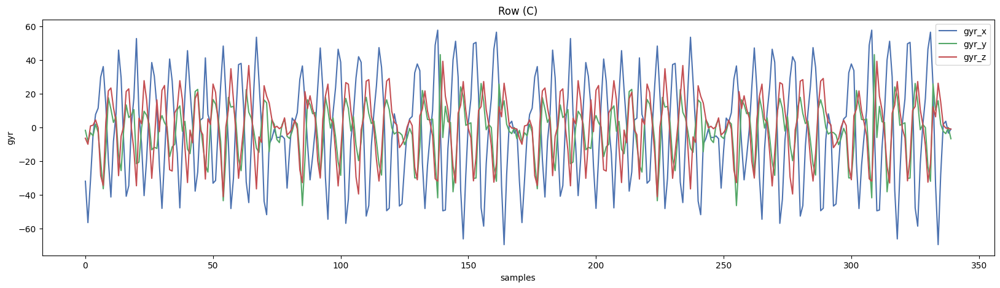

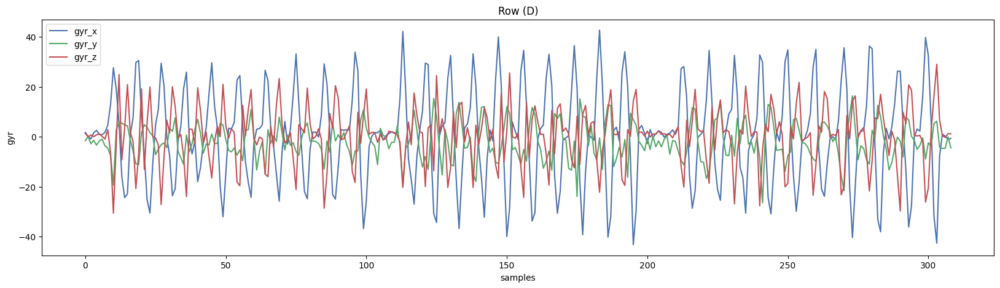

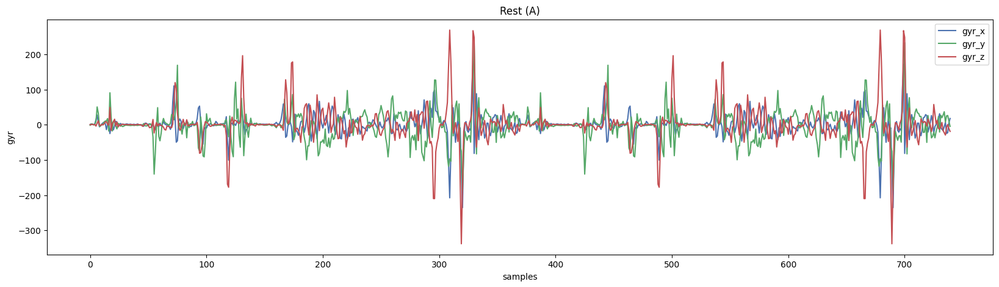

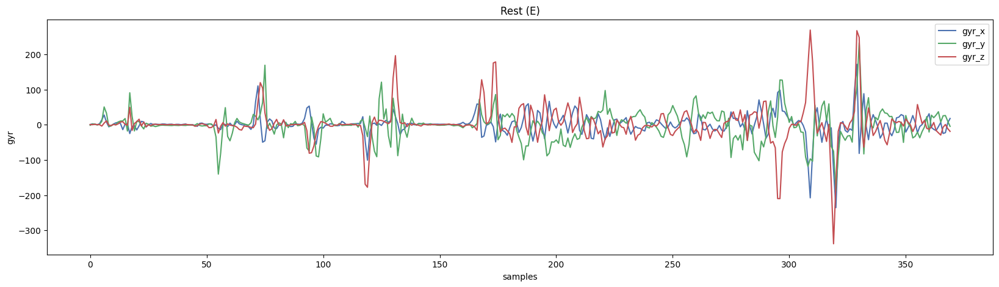

In [104]:
for label in labels:
    for participant in participants:
        all_axis_df = df.query(f"label == '{label}'").query(f"participant == '{participant}'").reset_index()


        if len(all_axis_df) > 0:
            fig, ax = plt.subplots()
            all_axis_df[["gyr_x","gyr_y","gyr_z"]].plot(ax=ax)
            ax.set_ylabel("gyr")
            ax.set_xlabel("samples")
            plt.title(f"{label} ({participant})".title())
            plt.legend();

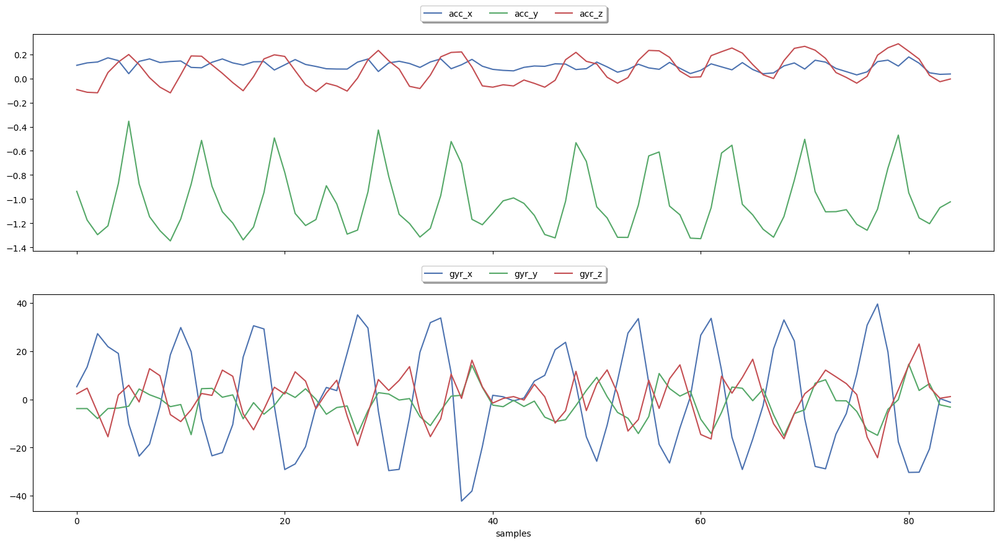

In [105]:
# Combine plots in one figure

label = "row"
participant = "A"

combined_plot_df = df.query(f"label == '{label}'").query(f"participant == '{participant}'").reset_index(drop=True)

fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(20,10))
combined_plot_df[["acc_x","acc_y","acc_z"]].plot(ax=ax[0])
combined_plot_df[["gyr_x","gyr_y","gyr_z"]].plot(ax=ax[1])

ax[0].legend(loc="upper center", bbox_to_anchor=(0.5,1.15), ncol=3, fancybox=True,shadow=True)
ax[1].legend(loc="upper center", bbox_to_anchor=(0.5,1.15), ncol=3, fancybox=True,shadow=True)
ax[1].set_xlabel("samples");

In [106]:
# Loop over all combinations and export for both sensors

for label in labels:
    for participant in participants:
        combined_plot_df = df.query(f"label == '{label}'").query(f"participant == '{participant}'").reset_index()


        if len(all_axis_df) > 0:
            fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(20,10))
            combined_plot_df[["acc_x","acc_y","acc_z"]].plot(ax=ax[0])
            combined_plot_df[["gyr_x","gyr_y","gyr_z"]].plot(ax=ax[1])

            ax[0].legend(loc="upper center", bbox_to_anchor=(0.5,1.15), ncol=3, fancybox=True,shadow=True)
            ax[1].legend(loc="upper center", bbox_to_anchor=(0.5,1.15), ncol=3, fancybox=True,shadow=True)
            ax[1].set_xlabel("samples")
            # plt.savefig(f"../../reports/figures/{label.title()} ({participant}).png")
            plt.show();